In [1]:
library("Matrix")
library(Seurat)
library(DT)
library(dplyr)
library(here)
library(ggplot2)
library(SingleCellExperiment)
library(scater)
library(mclust)
library(kableExtra)
library(cowplot)
library(tidyverse)
library(reshape)
library(harmony)
library(SingleR)
library(topGO)
library(annotate)
library("org.Mm.eg.db")
library(biomaRt)
library(ReactomePA)
library(seq2pathway)
library(scCustomize)
library(future)
library(ggnewscale)
library(furrr)
library(readxl)
library(STACAS)
library(clusterProfiler)

rank_score_func <- function(df){

df <- df %>% mutate(score = -1*log(p_val_adj+(10^-310))*avg_logFC*(pct.1/(pct.2+10^-300)))

return(df)
}

convertHumanGeneList <- function(x){

require("biomaRt")
human = useMart("ensembl", dataset = "hsapiens_gene_ensembl")
mouse = useMart("ensembl", dataset = "mmusculus_gene_ensembl")

genesV2 = getLDS(attributes = c("hgnc_symbol"), filters = "hgnc_symbol", values = x , mart = human, attributesL = c("mgi_symbol"), martL = mouse, uniqueRows=T)

humanx <- unique(genesV2[, 2])

# Print the first 6 genes found to the screen
print(head(humanx))
return(humanx)
}

library("remotes")
library("fs")

ggtheme <- function() {
  theme(
    axis.text = element_text(size = 20),
    axis.title = element_text(size = 20),
    text = element_text(size = 20, colour = "black"),
    legend.text = element_text(size = 20),
    legend.key.size =  unit(10, units = "points")
    
  )
}

mid.se <- celldex::MonacoImmuneData();

The legacy packages maptools, rgdal, and rgeos, underpinning the sp package,
which was just loaded, will retire in October 2023.
Please refer to R-spatial evolution reports for details, especially
https://r-spatial.org/r/2023/05/15/evolution4.html.
It may be desirable to make the sf package available;
package maintainers should consider adding sf to Suggests:.
The sp package is now running under evolution status 2
     (status 2 uses the sf package in place of rgdal)

Attaching SeuratObject


Attaching package: ‘DT’


The following object is masked from ‘package:SeuratObject’:

    JS


The following object is masked from ‘package:Seurat’:

    JS



Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


here() starts at /home/vercanie/PRIMUS/data/48_lab/Jupyter/231003_DiabetesV02

Loading required package: SummarizedExperiment

Loading requir

Warning message:
“replacing previous import ‘WGCNA::cor’ by ‘stats::cor’ when loading ‘seq2pathway’”
scCustomize v1.1.1
If you find the scCustomize useful please cite.
See 'samuel-marsh.github.io/scCustomize/articles/FAQ.html' for citation info.

clusterProfiler v4.6.2  For help: https://yulab-smu.top/biomedical-knowledge-mining-book/

If you use clusterProfiler in published research, please cite:
T Wu, E Hu, S Xu, M Chen, P Guo, Z Dai, T Feng, L Zhou, W Tang, L Zhan, X Fu, S Liu, X Bo, and G Yu. clusterProfiler 4.0: A universal enrichment tool for interpreting omics data. The Innovation. 2021, 2(3):100141


Attaching package: ‘clusterProfiler’


The following object is masked from ‘package:biomaRt’:

    select


The following object is masked from ‘package:AnnotationDbi’:

    select


The following object is masked from ‘package:reshape’:

    rename


The following object is masked from ‘package:purrr’:

    simplify


The following object is masked from ‘package:IRanges’:

    sli

In [115]:
plan("multisession")

# All diabetes data - new and old

## CD4 new

In [2]:
paths  <- list.files("data/rawdata/", full.names = T)

In [3]:
paths

[1] "data/rawdata//exp08_init_with_Mixcr.rds"      
 [2] "data/rawdata//exp10_init_with_Mixcr.rds"      
 [3] "data/rawdata//exp11_W1_init_with_Mixcr.rds"   
 [4] "data/rawdata//exp11_W2_init_with_Mixcr.rds"   
 [5] "data/rawdata//exp16_CD4_A_init_with_Mixcr.rds"
 [6] "data/rawdata//exp16_CD4_B_init_with_Mixcr.rds"
 [7] "data/rawdata//exp16_CD8_A_init_with_Mixcr.rds"
 [8] "data/rawdata//exp16_CD8_B_init_with_Mixcr.rds"
 [9] "data/rawdata//exp18_1_init_with_Mixcr.rds"    
[10] "data/rawdata//exp18_2_init_with_Mixcr.rds"    
[11] "data/rawdata//exp18_3_init_with_Mixcr.rds"    
[12] "data/rawdata//exp18_4_init_with_Mixcr.rds"    
[13] "data/rawdata//exp19_1_init_with_Mixcr.rds"    
[14] "data/rawdata//exp19_2_init_with_Mixcr.rds"    
[15] "data/rawdata//exp19_3_init_with_Mixcr.rds"    
[16] "data/rawdata//exp19_4_init_with_Mixcr.rds"    
[17] "data/rawdata//exp20_1_init_with_Mixcr.rds"    
[18] "data/rawdata//exp20_2_init_with_Mixcr.rds"    
[19] "data/rawdata//exp20_3_init_with_Mixcr.rds"    
[20] "data/rawdata//exp20_4_init_with_Mixcr.rds"

In [4]:
seu_list  <- map(paths[c(2,4,5,6,10,12,14,16,18,20)], readRDS)

In [5]:
seu_list[[1]]$hashtags  %>% table

.
 H1 H10  H2  H3  H4  H5  H6  H7  H8  H9 
743 831 821 762 825 695 821 761 787 802 

In [6]:
exp10_cd4  <- subset(seu_list[[1]], hashtags != "H5")

In [7]:
seu_list[[1]] <- exp10_cd4

In [8]:
seu_list[[1]]$Condition  %>% table

.
Ctrl T0  Dia T0 
   2326    4827 

In [9]:
new_dia_cd4  <- scCustomize::Merge_Seurat_List(seu_list)

Warning message in CheckDuplicateCellNames(object.list = objects):
“Some cell names are duplicated across objects provided. Renaming to enforce unique cell names.”
Warning message in CheckDuplicateCellNames(object.list = objects):
“Some cell names are duplicated across objects provided. Renaming to enforce unique cell names.”
Warning message in CheckDuplicateCellNames(object.list = objects):
“Some cell names are duplicated across objects provided. Renaming to enforce unique cell names.”
Warning message in CheckDuplicateCellNames(object.list = objects):
“Some cell names are duplicated across objects provided. Renaming to enforce unique cell names.”
Warning message in CheckDuplicateCellNames(object.list = objects):
“Some cell names are duplicated across objects provided. Renaming to enforce unique cell names.”


In [10]:
new_dia_cd4

An object of class Seurat 
15427 features across 98852 samples within 3 assays 
Active assay: RNA (15413 features, 0 variable features)
 2 other assays present: Antibodies, PTPRC

In [11]:
options(future.globals.maxSize = 10000 * 1024^2)
plan("sequential")

In [12]:
DefaultAssay(new_dia_cd4)  <- "RNA"
new_dia_cd4 <- NormalizeData(new_dia_cd4, verbose = FALSE)
new_dia_cd4 <- ScaleData(new_dia_cd4, verbose = FALSE)
new_dia_cd4 <- FindVariableFeatures(new_dia_cd4, nfeatures = 1000, verbose = FALSE)
new_dia_cd4 <- RunPCA(new_dia_cd4, npcs = 12, verbose = FALSE)
new_dia_cd4 <- RunUMAP(new_dia_cd4, reduction = "pca", dims = 1:12)

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
22:26:33 UMAP embedding parameters a = 0.9922 b = 1.112

22:26:33 Read 98852 rows and found 12 numeric columns

22:26:33 Using Annoy for neighbor search, n_neighbors = 30

22:26:33 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

22:26:47 Writing NN index file to temp file /tmp/RtmpF1LRFr/file308a968579bc

22:26:47 Searching Annoy index using 1 thread, search_k = 3000

22:27:44 Annoy recall = 100%

22:27:45 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors 

In [13]:
new_dia_cd4 <- FindNeighbors(new_dia_cd4, dims = 1:12)
new_dia_cd4 <- FindClusters(new_dia_cd4, resolution = 1)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 98852
Number of edges: 2594592

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8275
Number of communities: 20
Elapsed time: 66 seconds


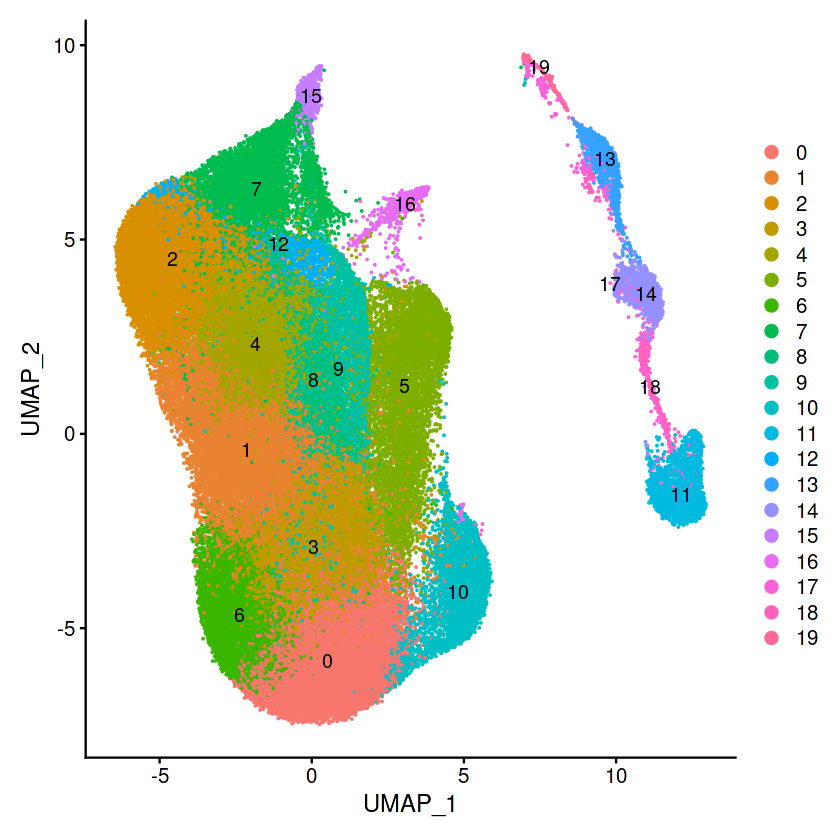

In [14]:
DimPlot(new_dia_cd4, label = T)

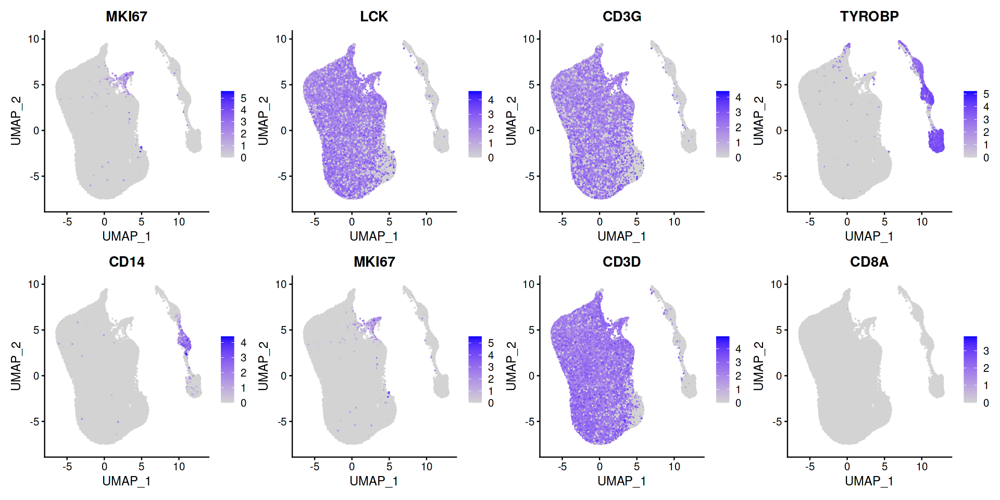

In [15]:
options(repr.plot.width = 16, repr.plot.height = 8)
FeaturePlot(new_dia_cd4, features = c("MKI67", "LCK", "CD3G", "TYROBP", "CD14", "MKI67", "CD3D", "CD8A"), ncol = 4)

### Automated annotation of cell types

In [16]:
library(Azimuth)
mid.se <- celldex::MonacoImmuneData()
hpca.se  <- celldex::HumanPrimaryCellAtlasData()
load("data/ref_wherry_new.RData")

Registered S3 method overwritten by 'SeuratDisk':
  method            from  
  as.sparse.H5Group Seurat

Attaching shinyBS

rgeos version: 0.6-3, (SVN revision 696)
 GEOS runtime version: 3.8.0-CAPI-1.13.1 
 Please note that rgeos will be retired during October 2023,
plan transition to sf or terra functions using GEOS at your earliest convenience.
See https://r-spatial.org/r/2023/05/15/evolution4.html for details.
 Linking to sp version: 1.6-0 
 Polygon checking: TRUE 


snapshotDate(): 2022-10-31

see ?celldex and browseVignettes('celldex') for documentation

loading from cache

see ?celldex and browseVignettes('celldex') for documentation

loading from cache

snapshotDate(): 2022-10-31

see ?celldex and browseVignettes('celldex') for documentation

loading from cache

see ?celldex and browseVignettes('celldex') for documentation

loading from cache



In [17]:
annotate_tcell_data  <- function(seurat_dataset){
    
    ## This function annotates a Seurat object with three annotations:
    ## 1. Monaco Immune dataset annotations
    ## 2. Annotations based on bulk RNAseq from Giles et al, 2022
    ## 3. Azimuth annotations
        
    DefaultAssay(seurat_dataset)  <- "RNA"
	
    ### Annotate the dataset with Monaco Immune dataset
		pred.singler <- SingleR(test = seurat_dataset@assays$RNA@counts, ref = mid.se, assay.type.test=1,
		labels = mid.se$label.fine)
    
	### Annotate the dataset with Wherry dataset
        pred.singler2 <- SingleR(test = seurat_dataset@assays$RNA@counts, ref = ref_wherry_new$matrix,
		labels = ref_wherry_new$labels)

    	### Annotate the dataset with Wherry dataset
        pred.singler3 <- SingleR(test = seurat_dataset@assays$RNA@counts, ref = hpca.se,
		assay.type.test=1,
		labels = hpca.se$label.fine)

		all_labels <- data.frame(
		Monaco_single = pred.singler$labels,
		HPCA_single = pred.singler3$labels,
		Wherry_main = pred.singler2$labels,
		barcode = colnames(seurat_dataset))
		
		md2 <- seurat_dataset@meta.data
		md2$barcode = colnames(seurat_dataset)

		md3 <- left_join(md2, all_labels)

		seurat_dataset@meta.data <- md3
		rownames(seurat_dataset@meta.data) <- colnames(seurat_dataset)
		
	### Annotate the dataset with Azimuth
		
		seurat_dataset <- RunAzimuth(seurat_dataset, reference = "pbmcref")
		seurat_dataset$predicted.celltype.l1 %>% table
		seurat_dataset$predicted.celltype.l2 %>% table
		seurat_dataset$predicted.celltype.l3 %>% table
		table(seurat_dataset$predicted.celltype.l3, seurat_dataset$Wherry_main)
		table(seurat_dataset$predicted.celltype.l3, seurat_dataset$Monaco_single)
		table(seurat_dataset$Wherry_main, seurat_dataset$Monaco_single)
		return(seurat_dataset)
	}


new_dia_cd4  <- annotate_tcell_data(new_dia_cd4)

Warning message:
“useNames = NA is deprecated. Instead, specify either useNames = TRUE or useNames = TRUE.”
Warning message:
“useNames = NA is deprecated. Instead, specify either useNames = TRUE or useNames = TRUE.”
Warning message:
“useNames = NA is deprecated. Instead, specify either useNames = TRUE or useNames = TRUE.”
Warning message:
“useNames = NA is deprecated. Instead, specify either useNames = TRUE or useNames = TRUE.”
Warning message:
“useNames = NA is deprecated. Instead, specify either useNames = TRUE or useNames = TRUE.”
Warning message:
“useNames = NA is deprecated. Instead, specify either useNames = TRUE or useNames = TRUE.”
Warning message:
“useNames = NA is deprecated. Instead, specify either useNames = TRUE or useNames = TRUE.”
Warning message:
“useNames = NA is deprecated. Instead, specify either useNames = TRUE or useNames = TRUE.”
Warning message:
“useNames = NA is deprecated. Instead, specify either useNames = TRUE or useNames = TRUE.”
Warning message:
“useNames =

Warning message:
“useNames = NA is deprecated. Instead, specify either useNames = TRUE or useNames = TRUE.”
Warning message:
“useNames = NA is deprecated. Instead, specify either useNames = TRUE or useNames = TRUE.”
Warning message:
“useNames = NA is deprecated. Instead, specify either useNames = TRUE or useNames = TRUE.”
Warning message:
“useNames = NA is deprecated. Instead, specify either useNames = TRUE or useNames = TRUE.”
Warning message:
“useNames = NA is deprecated. Instead, specify either useNames = TRUE or useNames = TRUE.”
Warning message:
“useNames = NA is deprecated. Instead, specify either useNames = TRUE or useNames = TRUE.”
Warning message:
“useNames = NA is deprecated. Instead, specify either useNames = TRUE or useNames = TRUE.”
Warning message:
“useNames = NA is deprecated. Instead, specify either useNames = TRUE or useNames = TRUE.”
Warning message:
“useNames = NA is deprecated. Instead, specify either useNames = TRUE or useNames = TRUE.”
Warning message:
“useNames =

Warning message:
“useNames = NA is deprecated. Instead, specify either useNames = TRUE or useNames = TRUE.”
Warning message:
“useNames = NA is deprecated. Instead, specify either useNames = TRUE or useNames = TRUE.”
Warning message:
“useNames = NA is deprecated. Instead, specify either useNames = TRUE or useNames = TRUE.”
Warning message:
“useNames = NA is deprecated. Instead, specify either useNames = TRUE or useNames = TRUE.”
Warning message:
“useNames = NA is deprecated. Instead, specify either useNames = TRUE or useNames = TRUE.”
Warning message:
“useNames = NA is deprecated. Instead, specify either useNames = TRUE or useNames = TRUE.”
Warning message:
“useNames = NA is deprecated. Instead, specify either useNames = TRUE or useNames = TRUE.”
Warning message:
“useNames = NA is deprecated. Instead, specify either useNames = TRUE or useNames = TRUE.”
Warning message:
“useNames = NA is deprecated. Instead, specify either useNames = TRUE or useNames = TRUE.”
Warning message:
“useNames =

An AzimuthData object - reference version: 1.0.0 
Contains 3 meta.data field(s) to transfer.

Warning message:
“Overwriting miscellanous data for model”
detected inputs from HUMAN with id type Gene.name

reference rownames detected HUMAN with id type Gene.name

Using reference SCTModel to calculate pearson residuals

Determine variable features

Setting min_variance to:  -Inf

Calculating residuals of type pearson for 3918 genes



  |======================================================================| 100%


Set default assay to refAssay

Normalizing query using reference SCT model

Projecting cell embeddings

Finding query neighbors

Finding neighborhoods

Finding anchors

	Found 9364 anchors

Finding integration vectors

Finding integration vector weights

Predicting cell labels

Warning message:
“Keys should be one or more alphanumeric characters followed by an underscore, setting key from predictionscorecelltype.l1_ to predictionscorecelltypel1_”
Predicting cell labels

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Keys should be one or more alphanumeric characters followed by an underscore, setting key from predictionscorecelltype.l2_ to predictionscorecelltypel2_”
Predicting cell labels

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Keys should be one or more alphanumeric characters followed by an underscore, setting key from predictionscorecelltype.l3_ to p

In [ ]:
saveRDS(new_dia_cd4, "data/processed/cd4_full.rds")

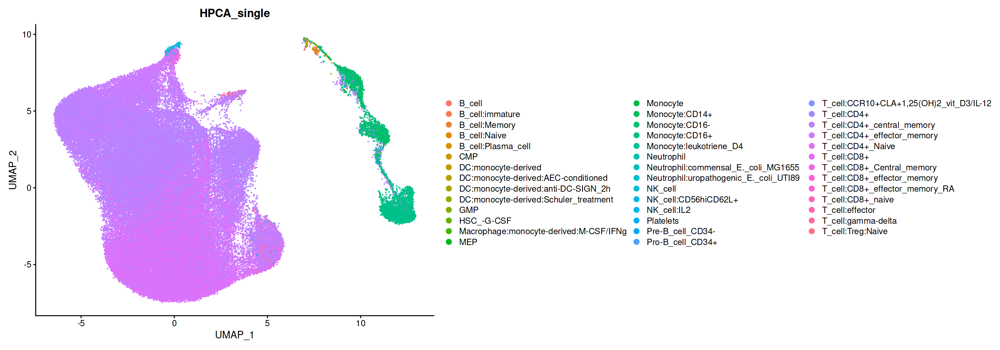

In [18]:
options(repr.plot.width = 20, repr.plot.height = 7)

DimPlot(new_dia_cd4, raster = F, group.by = "HPCA_single", label = F)

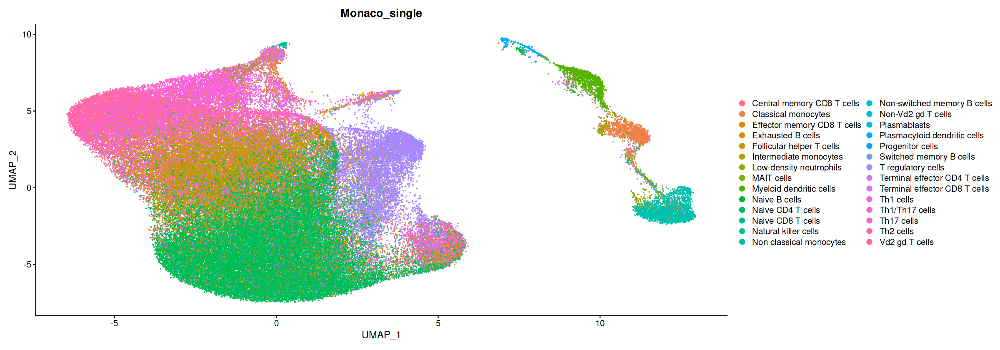

In [19]:
DimPlot(new_dia_cd4, raster = F, group.by = "Monaco_single", label = F)

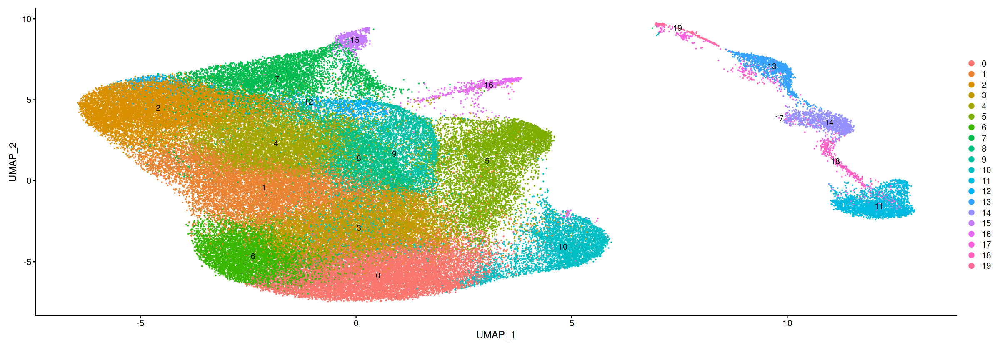

In [20]:
DimPlot(new_dia_cd4, label = T, raster = F)

### Remove contaminating cells

In [21]:
new_dia_cd4  <- subset(new_dia_cd4, seurat_clusters %in% c(0:10,12,15,16))

Warning message:
“Keys should be one or more alphanumeric characters followed by an underscore, setting key from ref.umap_ to refumap_”


In [22]:
DefaultAssay(new_dia_cd4)  <- "RNA"
new_dia_cd4 <- NormalizeData(new_dia_cd4, verbose = FALSE)

new_dia_cd4 <- ScaleData(new_dia_cd4, verbose = FALSE)
new_dia_cd4 <- FindVariableFeatures(new_dia_cd4, nfeatures = 1000, verbose = FALSE)
new_dia_cd4 <- RunPCA(new_dia_cd4, npcs = 12, verbose = FALSE)
new_dia_cd4 <- RunUMAP(new_dia_cd4, reduction = "pca", dims = 1:12)

new_dia_cd4 <- FindNeighbors(new_dia_cd4, dims = 1:12)
new_dia_cd4 <- FindClusters(new_dia_cd4, resolution = 1)

23:28:56 UMAP embedding parameters a = 0.9922 b = 1.112

23:28:56 Read 92900 rows and found 12 numeric columns

23:28:56 Using Annoy for neighbor search, n_neighbors = 30

23:28:56 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

23:29:12 Writing NN index file to temp file /tmp/RtmpF1LRFr/file308a96fcc5c0e

23:29:12 Searching Annoy index using 1 thread, search_k = 3000

23:30:04 Annoy recall = 100%

23:30:05 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

23:30:13 Initializing from normalized Laplacian + noise (using irlba)

23:30:22 Commencing optimization for 200 epochs, with 3935436 positive edges

23:31:29 Optimization finished

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 92900
Number of edges: 2327949

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8133
Number of communities: 17
Elapsed time: 59 seconds


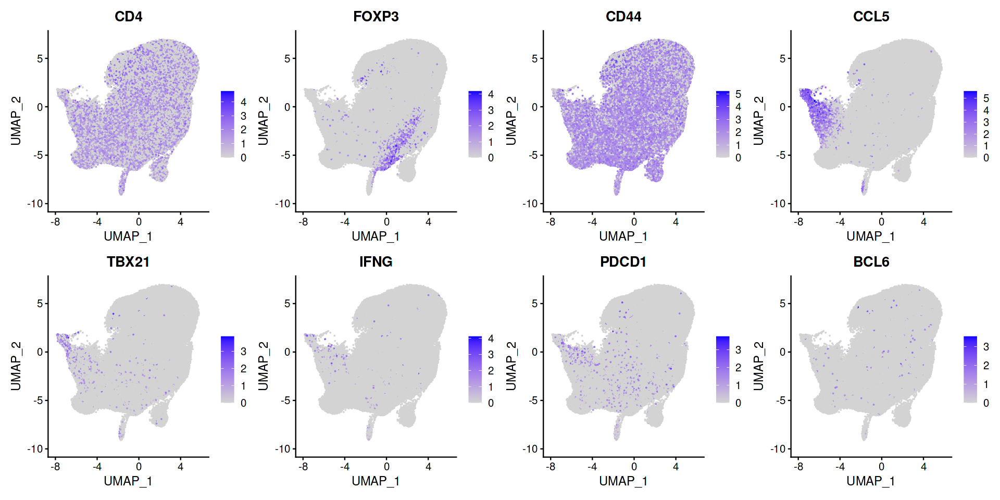

In [23]:
options(repr.plot.width = 16, repr.plot.height = 8)

FeaturePlot(new_dia_cd4, features = c("CD4", "FOXP3", "CD44", "CCL5", "TBX21", "IFNG", "PDCD1", "BCL6"), ncol = 4)

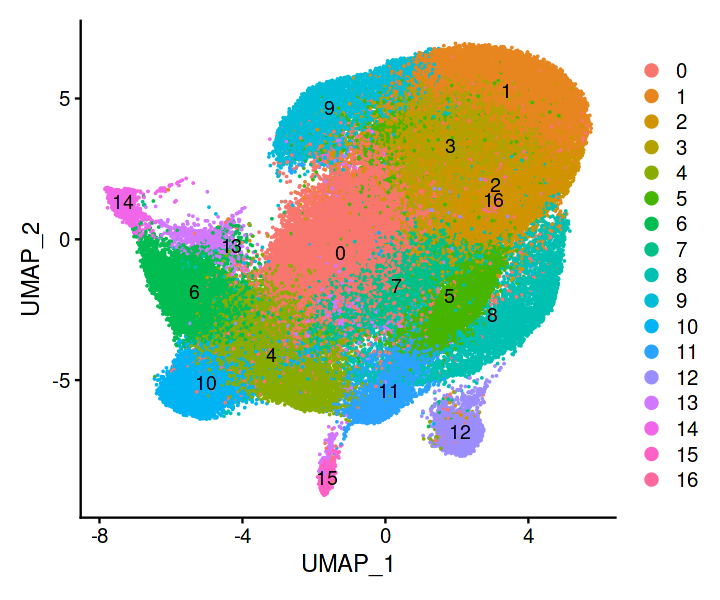

In [24]:
options(repr.plot.width = 6, repr.plot.height = 5)
DimPlot(new_dia_cd4, label = T)

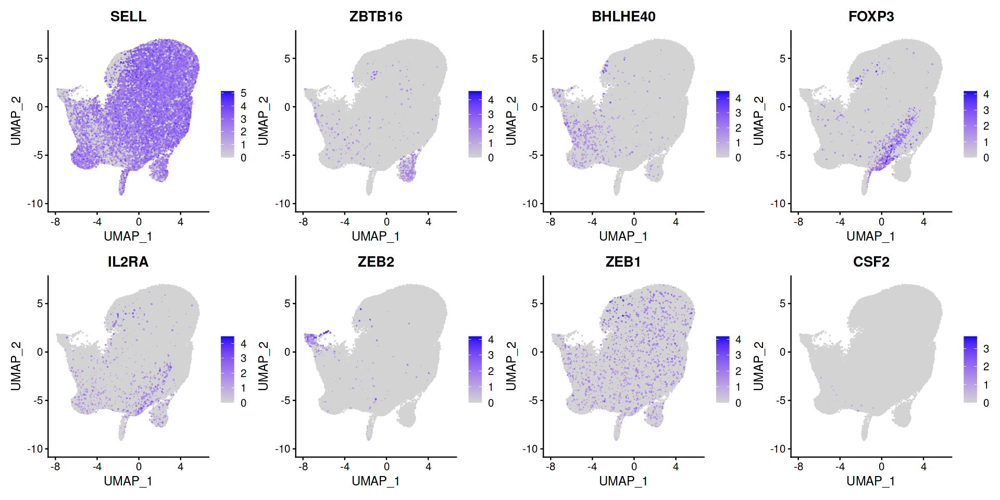

In [25]:
options(repr.plot.width = 16, repr.plot.height = 8)

FeaturePlot(new_dia_cd4, features = c("SELL", "ZBTB16", "BHLHE40", "FOXP3", "IL2RA", "ZEB2", "ZEB1", "CSF2"), ncol = 4)

In [26]:
new_dia_cd4@meta.data  <- new_dia_cd4@meta.data  %>% separate(Condition, into = c("Disease", "Time"), remove = F, sep = " ")

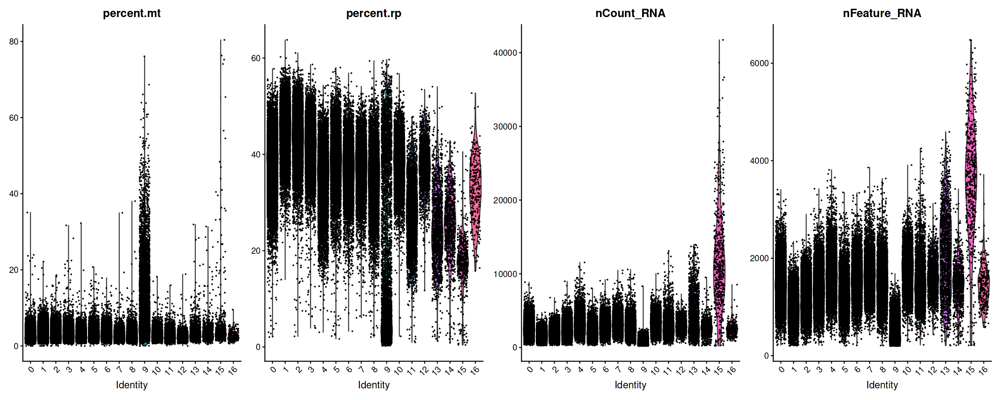

In [27]:
options(repr.plot.width = 20)
VlnPlot(new_dia_cd4, features = c("percent.mt", "percent.rp", "nCount_RNA", "nFeature_RNA"), ncol = 4)

### Remove dead cells

In [28]:
cutoff_nFeature_RNA <- 500
cutoff_percent_mt <- 10
cluster_exclude <- c(9)

In [29]:
p1 <- ggplot(data.frame(nCount_RNA = new_dia_cd4$nCount_RNA,
                  nFeature_RNA = new_dia_cd4$nFeature_RNA,
                  percent_mt = new_dia_cd4$percent.mt,
                  seurat_clusters = new_dia_cd4$seurat_clusters,
                  exclude = ifelse(new_dia_cd4$seurat_clusters %in% cluster_exclude, TRUE, FALSE)), 
       aes(x = seurat_clusters, y = percent_mt)) +
  geom_violin(scale = "width", aes(fill = exclude)) + 
  geom_hline(yintercept = cutoff_percent_mt,
               geom = "line", 
               width = 0.5,
               colour = "red") + 
  ggtitle("Percent mt. cutoff") + 
  theme_classic() +
  scale_fill_manual(values = c("white","red")) +
  theme(panel.background = element_blank(), 
        axis.text.x = element_text(angle = 0, hjust = 1)) +
  annotate(geom = "rect", xmin = min(as.numeric(new_dia_cd4$seurat_clusters))-1, 
           xmax = max(as.numeric(new_dia_cd4$seurat_clusters))+1, 
           ymin=cutoff_percent_mt,ymax=1.1*(max(new_dia_cd4$percent.mt)), fill = "red", alpha = 0.1)

p2 <- ggplot(data.frame(nCount_RNA = new_dia_cd4$nCount_RNA,
                  nFeature_RNA = new_dia_cd4$nFeature_RNA,
                  percent_mt = new_dia_cd4$percent.mt,
                  seurat_clusters = new_dia_cd4$seurat_clusters,
                        exclude = ifelse(new_dia_cd4$seurat_clusters %in% cluster_exclude, TRUE, FALSE)), 
       aes(x = seurat_clusters, y = nFeature_RNA)) +
  geom_violin(scale = "width", aes(fill = exclude)) + 
  geom_hline(yintercept = cutoff_nFeature_RNA,
               geom = "line", 
               width = 0.5,
               colour = "red") + 
  ggtitle("nFeature RNA cutoff") + 
  theme_classic() +
  scale_fill_manual(values = c("white","red")) +
  theme(panel.background = element_blank(), 
        axis.text.x = element_text(angle = 0, hjust = 1)) +
  annotate(geom = "rect", xmin = min(as.numeric(new_dia_cd4$seurat_clusters))-1, 
           xmax = max(as.numeric(new_dia_cd4$seurat_clusters))+1, 
           ymin=0, ymax=cutoff_nFeature_RNA, fill = "red", alpha = 0.1)

Warning message in geom_hline(yintercept = cutoff_percent_mt, geom = "line", width = 0.5, :
“Ignoring unknown parameters: `geom` and `width`”
Warning message in geom_hline(yintercept = cutoff_nFeature_RNA, geom = "line", width = 0.5, :
“Ignoring unknown parameters: `geom` and `width`”


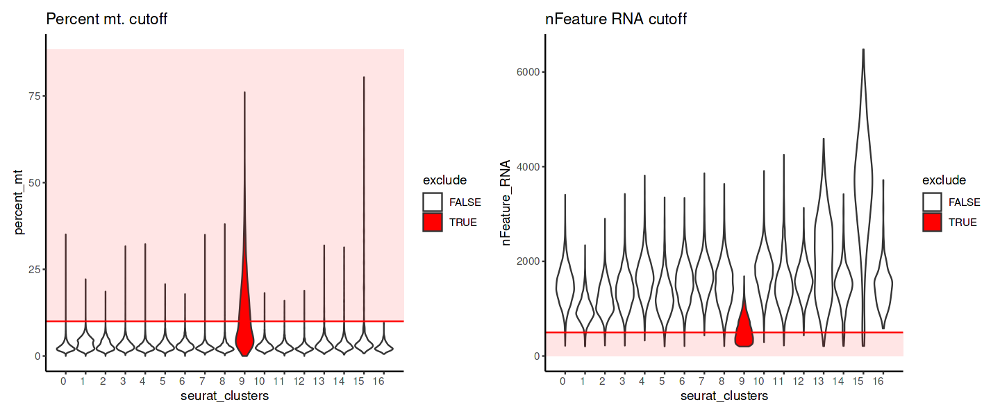

In [30]:
options(repr.plot.width = 12, repr.plot.height = 5)
p1 + p2

In [31]:
new_dia_cd4  <- subset(new_dia_cd4, 
                       seurat_clusters %in% c(0:8,10:16) &
                      percent.mt < cutoff_percent_mt &
                      nFeature_RNA > cutoff_nFeature_RNA)

In [32]:
new_dia_cd4 <- NormalizeData(new_dia_cd4, verbose = FALSE)

new_dia_cd4 <- ScaleData(new_dia_cd4, verbose = FALSE)
new_dia_cd4 <- FindVariableFeatures(new_dia_cd4, nfeatures = 1000, verbose = FALSE)
new_dia_cd4 <- RunPCA(new_dia_cd4, npcs = 12, verbose = FALSE)
new_dia_cd4 <- RunUMAP(new_dia_cd4, reduction = "pca", dims = 1:12)

new_dia_cd4 <- FindNeighbors(new_dia_cd4, dims = 1:12)
new_dia_cd4 <- FindClusters(new_dia_cd4, resolution = 1)

23:35:40 UMAP embedding parameters a = 0.9922 b = 1.112

23:35:40 Read 86848 rows and found 12 numeric columns

23:35:40 Using Annoy for neighbor search, n_neighbors = 30

23:35:40 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

23:35:52 Writing NN index file to temp file /tmp/RtmpF1LRFr/file308a934be54b1

23:35:52 Searching Annoy index using 1 thread, search_k = 3000

23:36:37 Annoy recall = 100%

23:36:40 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

23:36:47 Initializing from normalized Laplacian + noise (using irlba)

23:36:53 Commencing optimization for 200 epochs, with 3633604 positive edges

23:37:57 Optimization finished

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 86848
Number of edges: 2188307

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8092
Number of communities: 19
Elapsed time: 55 seconds


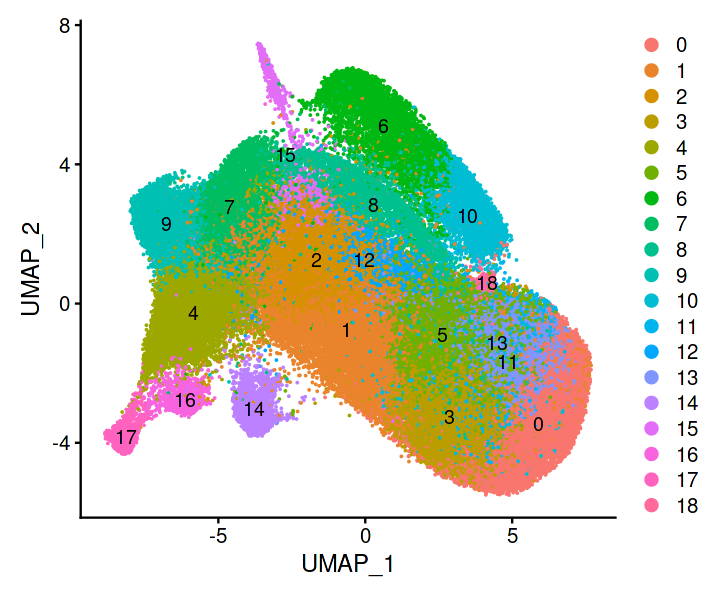

In [33]:
options(repr.plot.width = 6, repr.plot.height = 5)
DimPlot(new_dia_cd4, label = T)

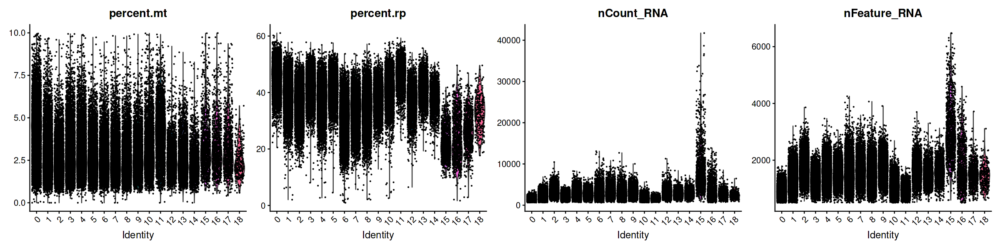

In [34]:
options(repr.plot.width = 20)
VlnPlot(new_dia_cd4, features = c("percent.mt", "percent.rp", "nCount_RNA", "nFeature_RNA"), ncol = 4)

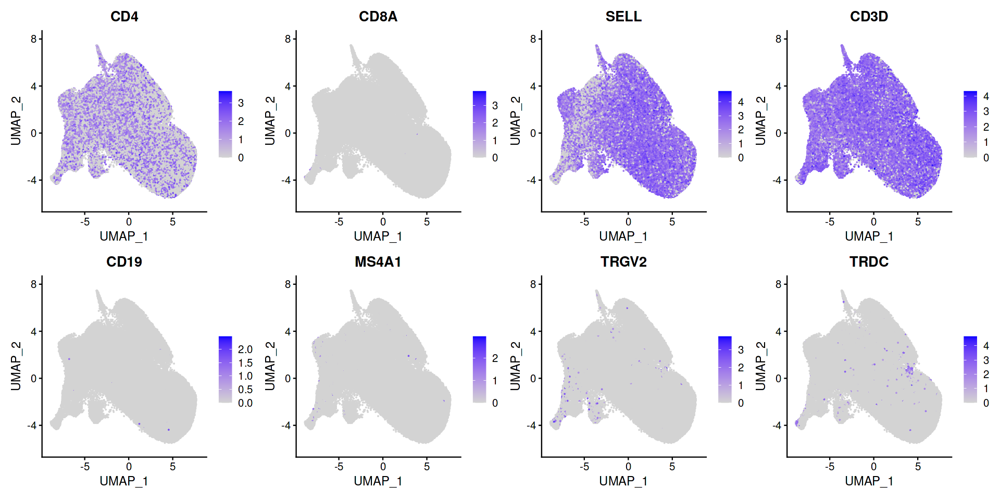

In [35]:
options(repr.plot.width = 16, repr.plot.height = 8)

FeaturePlot(new_dia_cd4, features = c("CD4", "CD8A", "SELL", "CD3D", "CD19", "MS4A1", "TRGV2", "TRDC"), ncol = 4)

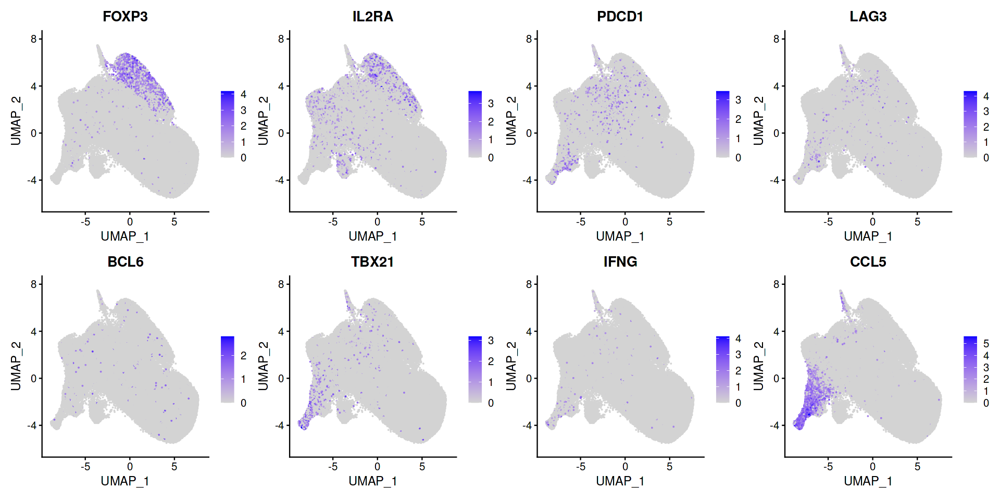

In [36]:
options(repr.plot.width = 16, repr.plot.height = 8)

FeaturePlot(new_dia_cd4, features = c("FOXP3", "IL2RA", "PDCD1", "LAG3", "BCL6", "TBX21", "IFNG", "CCL5"), ncol = 4)

Warning message:
“Could not find PTPRC-RA in the default search locations, found in PTPRC assay instead”
Warning message:
“Could not find PTPRC-RO in the default search locations, found in PTPRC assay instead”


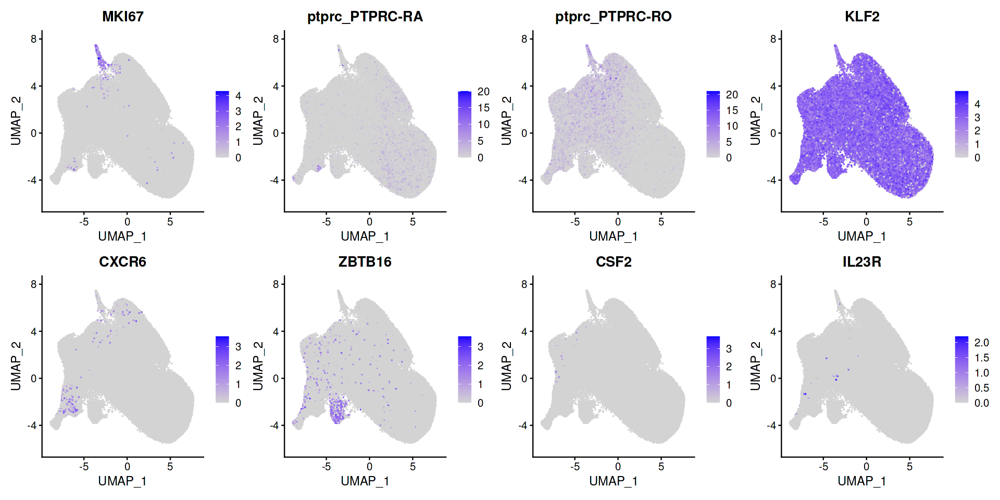

In [37]:
options(repr.plot.width = 16, repr.plot.height = 8)

FeaturePlot(new_dia_cd4, features = c("MKI67", "PTPRC-RA", "PTPRC-RO", "KLF2", "CXCR6", "ZBTB16", "CSF2", "IL23R"), ncol = 4)

In [38]:
new_dia_cd4@meta.data  %>% colnames

[1] "orig.ident"                  "nCount_RNA"                 
 [3] "nFeature_RNA"                "percent.mt"                 
 [5] "percent.rp"                  "nCount_Antibodies"          
 [7] "nFeature_Antibodies"         "hashtags"                   
 [9] "Experiment_ID"               "Prepared_by"                
[11] "Sample_ID"                   "Well"                       
[13] "Hashtag"                     "Hashtag_sequence"           
[15] "Hashtag_cat_n"               "Hashtag_dilution"           
[17] "Project.code"                "Well_CT_ID"                 
[19] "Condition"                   "Disease"                    
[21] "Time"                        "Species"                    
[23] "Age"                         "Age_group"                  
[25] "Sex"                         "Library_code"               
[27] "Patient_ID"                  "is_cell"                    
[29] "chain"                       "contig_id"                  
[31] "high_confidence"             "productive"                 
[33] "length"                      "reads"                      
[35] "umis"                        "vdj_source"                 
[37] "count_TRA"                   "count_TRB"                  
[39] "count_Multi"                 "cdr3_A1"                    
[41] "cdr3_A1_nt"                  "cdr3_A2"                    
[43] "cdr3_A2_nt"                  "cdr3_B"                     
[45] "cdr3_B_nt"                   "cdr3_Multi"                 
[47] "cdr3_Multi_nt"               "v_gene_A1"                  
[49] "j_gene_A1"                   "v_gene_A2"                  
[51] "j_gene_A2"                   "v_gene_B"                   
[53] "d_gene_B"                    "j_gene_B"                   
[55] "v_gene_Multi"                "d_gene_Multi"               
[57] "j_gene_Multi"                "clonotypes"                 
[59] "has.VDJ"                     "has.complete.VDJ"           
[61] "nCount_PTPRC"                "nFeature_PTPRC"             
[63] "RNA_snn_res.0.5"             "seurat_clusters"            
[65] "clonotype.repeated"          "RNA_snn_res.1"              
[67] "barcode"                     "Monaco_single"              
[69] "HPCA_single"                 "Wherry_main"                
[71] "nCount_refAssay"             "nFeature_refAssay"          
[73] "predicted.celltype.l1.score" "predicted.celltype.l1"      
[75] "predicted.celltype.l2.score" "predicted.celltype.l2"      
[77] "predicted.celltype.l3.score" "predicted.celltype.l3"      
[79] "mapping.score"

In [39]:
new_dia_cd4$Experiment_ID  %>% table

.
Exp10 Exp11 Exp16 Exp18 Exp19 Exp20 
 6736  6552 14018 24328 19976 15238 

In [40]:
new_dia_cd4$Condition  %>% table

.
   Ctrl T0    Ctrl T1     Dia T0     Dia T1 Pre-Dia T0 
     16594       4122      37989      25671       2472 

In [41]:
new_dia_cd4@meta.data  <- new_dia_cd4@meta.data  %>% separate(Condition, into = c("Disease", "Time"), remove = F, sep = " ")

In [42]:
new_dia_cd4$Time  <- if_else(is.na(new_dia_cd4$Time), "T0", new_dia_cd4$Time)

In [43]:
new_dia_cd4$Sample_char  <- paste(new_dia_cd4$Patient_ID, 
                                  new_dia_cd4$Disease,
                                  new_dia_cd4$Time,
                                  new_dia_cd4$Age_group,
                                  new_dia_cd4$Sex,
                                  new_dia_cd4$Experiment_ID)

### PCA on samples

In [44]:
cd4_samples  <- AverageExpression(new_dia_cd4, group.by = "Sample_char", return.seurat = T)

Warning message:
“Keys should be one or more alphanumeric characters followed by an underscore, setting key from prediction.score.celltype.l1_ to predictionscorecelltypel1_”
Warning message:
“Keys should be one or more alphanumeric characters followed by an underscore, setting key from prediction.score.celltype.l2_ to predictionscorecelltypel2_”
Warning message:
“Keys should be one or more alphanumeric characters followed by an underscore, setting key from prediction.score.celltype.l3_ to predictionscorecelltypel3_”
Centering and scaling data matrix



In [45]:
cd4_samples  <- FindVariableFeatures(cd4_samples)

In [46]:
cd4_samples  <- RunPCA(cd4_samples)

Warning message in irlba(A = t(x = object), nv = npcs, ...):
“You're computing too large a percentage of total singular values, use a standard svd instead.”
PC_ 1 
Positive:  PCBP2, ST13, RGS10, LSM5, ALKBH7, CALM3, EEF1D, SMPD1, EEF1A1, CCNI 
	   UQCRB, APEX1, LDLRAP1, CD7, C11orf1, TMIGD2, MMP28, GRINA, NOP53, LITAF 
	   SNRPN, SARAF, ATP6V0E2, METTL21A, AIF1, SCML4, HEBP1, TSPAN3, C12orf57, FBL 
Negative:  ZNRF2, TGFB1, GNB1, CDV3, STK24, GNAS, GNAI2, CD81, KMT2A, FAM117A 
	   MALT1, ABHD17A, URI1, PIP4K2A, GRK2, HNRNPD, PLCL2, TAF10, GLS, SRRM2 
	   OSBP, MAZ, CLPTM1L, KIAA2013, CSNK2A2, TMEM238, KCMF1, CAPNS1, CCNY, EIF3A 
PC_ 2 
Positive:  MTRNR2L12, WDR83OS, DNAJC25-GNG10, DERPC, WASH6P, AMMECR1L, RFLNB, AC007326.4, R3HDM2, COL6A3 
	   PMS2, USF2, PRRG3, ZBED6, RYBP, C17orf49, AL662899.2, RBFOX1, ENO3, GALNT1 
	   Z83844.2, ANTXRL, CRYBB2, PKD1, AL117339.4, FAM153B, STAG3, DPP6, MAP1LC3B2, MOB2 
Negative:  IL2RG, ARL6IP1, CRIP1, STXBP2, AC005833.1, SARNP, ECH1, NAA10, DYNLRB1, A

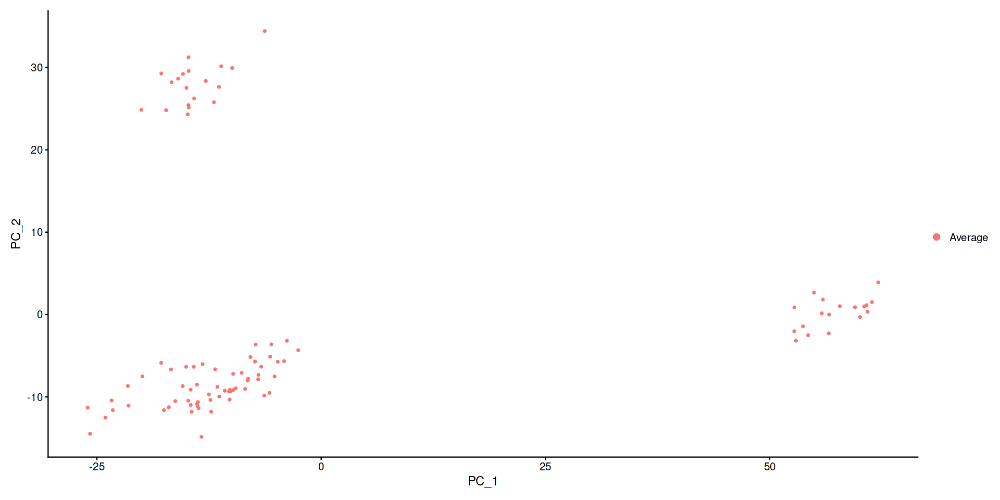

In [47]:
DimPlot(cd4_samples)

In [48]:
cd4_samples$Sample_char  <- colnames(cd4_samples)

In [49]:
cd4_samples$Sample_char  %>% table

.
    101 Dia T0 1 M Exp18     101 Dia T1 1 M Exp18     102 Dia T0 1 M Exp18 
                       1                        1                        1 
    102 Dia T1 1 M Exp18     103 Dia T0 2 M Exp18     103 Dia T1 2 M Exp18 
                       1                        1                        1 
    104 Dia T0 3 M Exp10     104 Dia T0 3 M Exp18     104 Dia T1 3 M Exp18 
                       1                        1                        1 
    105 Dia T0 1 M Exp10     105 Dia T0 1 M Exp18     105 Dia T1 1 M Exp18 
                       1                        1                        1 
    106 Dia T0 1 F Exp10     106 Dia T0 1 F Exp18     106 Dia T1 1 F Exp18 
                       1                        1                        1 
    107 Dia T0 1 M Exp11     107 Dia T0 1 M Exp18     107 Dia T1 1 M Exp18 
                       1                        1                        1 
    108 Dia T0 2 F Exp10     108 Dia T0 2 F Exp18     108 Dia T1 2 F Exp18 
          

In [50]:
cd4_samples@meta.data  <- cd4_samples@meta.data  %>% separate(Sample_char, 
                                                              into = c("Patient_ID",
                                                                      "Disease",
                                                                      "Time",
                                                                      "Age_group",
                                                                      "Sex",
                                                                      "Exp"), 
                                                             sep = " ",
                                                             remove = F)

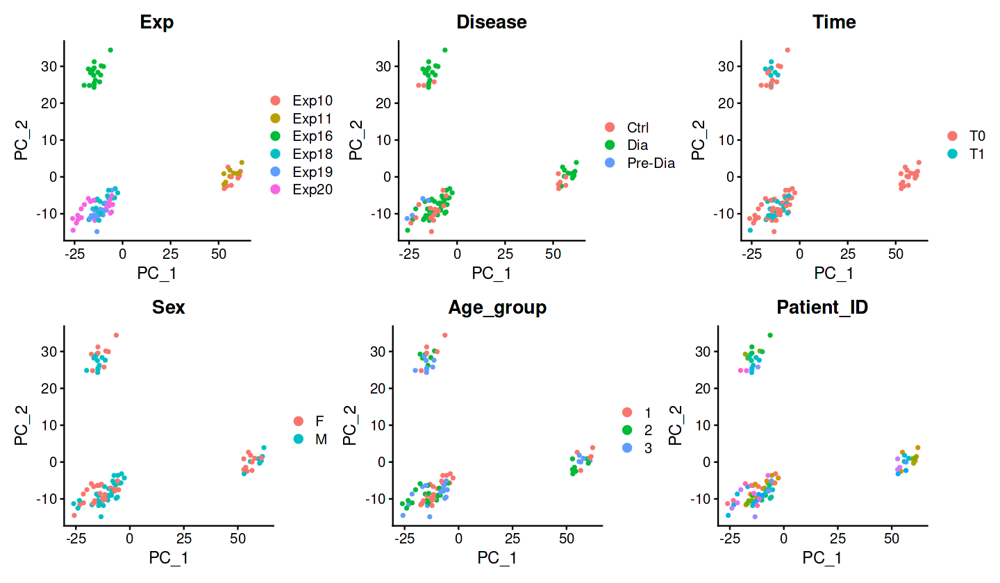

In [51]:
options(repr.plot.width = 12, repr.plot.height = 7)
(DimPlot(cd4_samples, group.by = "Exp") + DimPlot(cd4_samples, group.by = "Disease") + DimPlot(cd4_samples, group.by = "Time")) / (DimPlot(cd4_samples, group.by = "Sex") + DimPlot(cd4_samples, group.by = "Age_group") + (DimPlot(cd4_samples, group.by = "Patient_ID") + NoLegend()))

## STACAS Integration over Experiment

In [52]:
merged.list  <- SplitObject(new_dia_cd4, split.by = "Experiment_ID")

In [53]:
plan("sequential")

In [54]:
# normalize and identify variable features for each dataset independently
merged.list <- lapply(X = merged.list, FUN = function(x) {
    DefaultAssay(x)  <- "RNA"
    x$barcode  <- colnames(x)
    x <- NormalizeData(x)
    x <- FindVariableFeatures(x, selection.method = "vst", nfeatures = 2000)
})

library(STACAS)

new_dia_experiment <- Run.STACAS(merged.list, dims = 1:12)
new_dia_experiment <- RunUMAP(new_dia_experiment, dims = 1:12) 

Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 1.0 GiB”
Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 1.8 GiB”
Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 1.5 GiB”
Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 1.1 GiB”
Preparing PCA embeddings for objects...

Building integration tree with base dataset: 4

Merging dataset 3 into 4

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 5 into 4 3

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 6 into 4 3 5

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 2 into 1

Extracting anchors for merged samples

Finding 

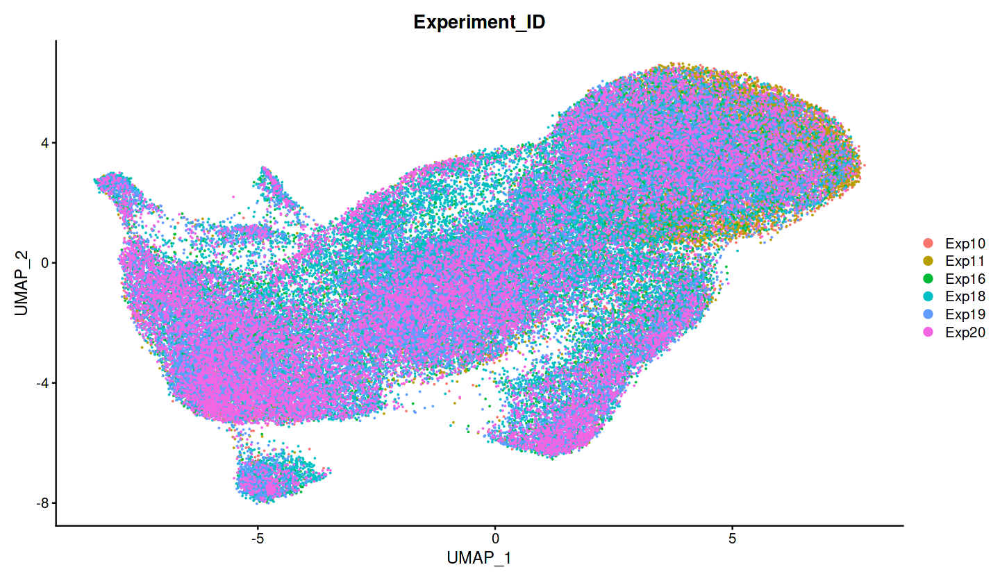

In [55]:
# Visualize

DimPlot(new_dia_experiment, group.by = c("Experiment_ID"))

In [51]:
saveRDS(new_dia_experiment, "data/processed/cd4_full.rds")

# Add metadata

In [56]:
md_dia  <- read_xlsx("data/dia_metadata.xlsx")

In [57]:
md_dia

id_pat,patient,rc,dat_nar,matched_dataset_manual,matched_group_manual,matched_dataset_propensity,matched_group_propensity,time_taken,age_taken,⋯,neutr_abs,eoz_abs,baz_abs,lymph_perc,mon_perc,neutr_perc,eoz_perc,baz_perc,tdd_1,tdd_per_kg_1
<dbl>,<dbl>,<chr>,<dttm>,<chr>,<dbl>,<chr>,<dbl>,<chr>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
101,101,1812230552,2018-12-23,NA,NA,NA,NA,T0,2.138261,⋯,0.88,0.10,0.04,0.700,0.090,0.170,0.020,0.008,17.8,1.4833333
102,102,1711110951,2017-11-11,NA,NA,NA,NA,T0,3.252567,⋯,3.03,0.06,0.05,0.440,0.089,0.450,0.009,0.008,21.5,1.2356322
103,103,1304191240,2013-04-19,yes,33,NA,NA,T0,7.816564,⋯,1.47,0.15,0.04,0.560,0.079,0.314,0.032,0.009,27.5,1.3414634
104,104,0408165087,2004-08-16,NA,NA,yes,33,T0,16.547570,⋯,3.60,0.24,0.03,0.290,0.089,0.574,0.038,0.005,24.5,0.5000000
105,105,1706101309,2017-06-10,NA,NA,NA,NA,T0,3.731691,⋯,2.76,0.36,0.06,0.500,0.072,0.360,0.047,0.008,15.0,0.7692308
106,106,1959271281,2019-09-27,NA,NA,NA,NA,T0,1.434634,⋯,1.45,0.21,0.03,0.667,0.100,0.199,0.029,0.004,10.5,1.0937500
107,107,1610250708,2016-10-25,NA,NA,NA,NA,T0,4.355921,⋯,1.60,0.13,0.03,0.700,0.052,0.221,0.018,0.004,16.0,0.9638554
108,108,1355270697,2013-05-27,yes,32,NA,NA,T0,7.786448,⋯,0.51,0.10,0.02,0.720,0.080,0.160,0.030,0.006,24.0,0.8888889
109,109,1506260129,2015-06-26,NA,NA,NA,NA,T0,5.705681,⋯,1.70,0.09,0.03,0.510,0.090,0.370,0.020,0.007,45.0,2.2500000


In [58]:
md_seurat  <- new_dia_experiment@meta.data

In [59]:
md_seurat$Patient_Time  <- paste(md_seurat$Patient_ID, md_seurat$Time)

In [60]:
md_joined  <- left_join(md_seurat, md_dia)

Joining with `by = join_by(Patient_Time)`


In [61]:
new_dia_experiment@meta.data  <- md_joined
rownames(new_dia_experiment@meta.data)  <- colnames(new_dia_experiment)

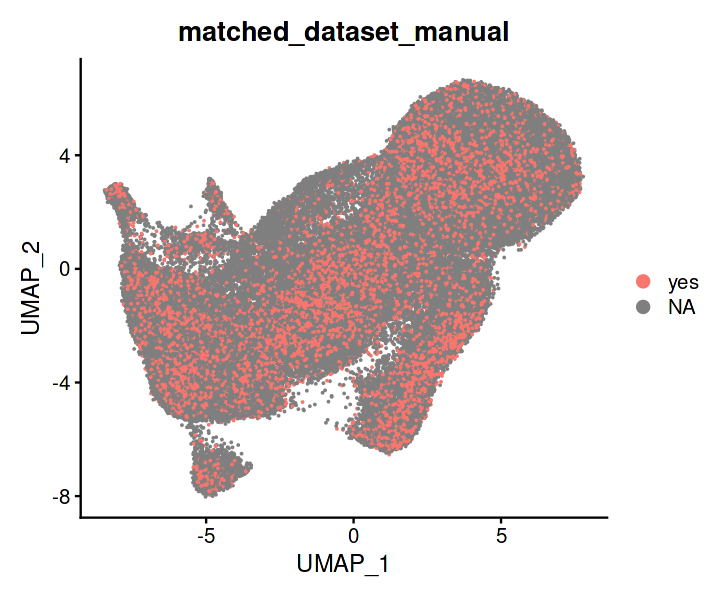

In [62]:
options(repr.plot.width = 6, repr.plot.height = 5)

DimPlot(new_dia_experiment, group.by = "matched_dataset_manual")

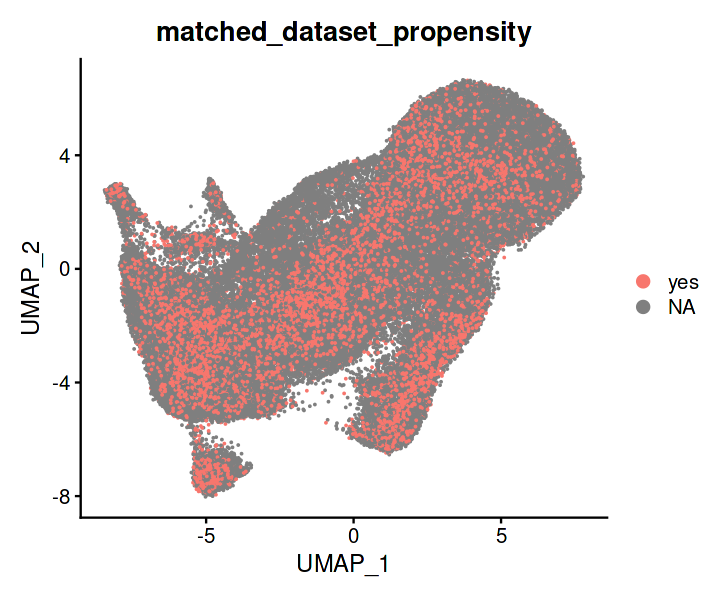

In [63]:
DimPlot(new_dia_experiment, group.by = "matched_dataset_propensity")

# Analysis CD4 Level 1

In [64]:
new_dia_cd4  <- new_dia_experiment

In [65]:
new_dia_cd4 <- FindNeighbors(new_dia_cd4, dims = 1:12)

Computing nearest neighbor graph

Computing SNN



In [66]:
new_dia_cd4 <- FindClusters(new_dia_cd4, resolution = 0.7)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 86848
Number of edges: 2258487

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8384
Number of communities: 13
Elapsed time: 55 seconds


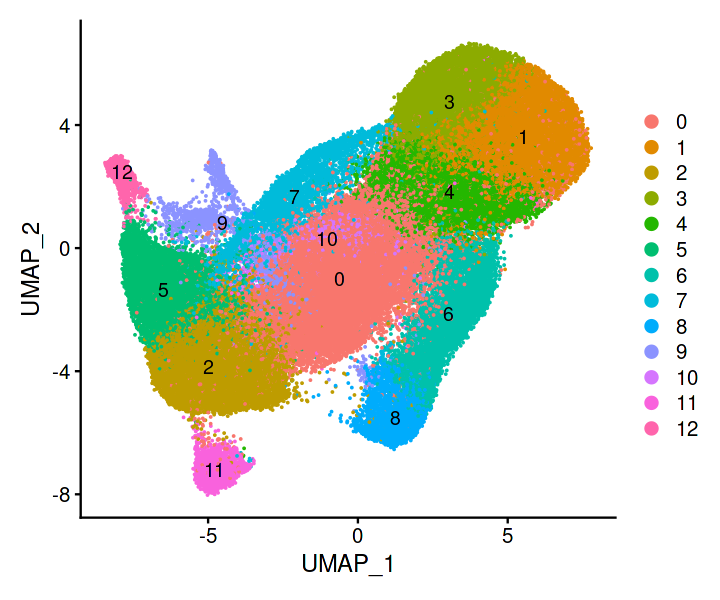

In [67]:
DimPlot(new_dia_cd4, label = T)

In [68]:
new_dia_cd4@meta.data  <- new_dia_cd4@meta.data  %>% 
mutate(annotations_l1 = recode_factor(seurat_clusters, 
                                      "0" = "CD4 T cells",
                                     "1" = "CD4 T cells",
                                     "2" = "CD4 T cells",
                                     "3" = "CD4 T cells",
                                     "4" = "CD4 T cells",
                                     "5" = "CD4 T cells",
                                     "6" = "CD4 T cells",
                                     "7" = "CD4 T cells",
                                     "8" = "CD4 T cells",
                                     "9" = "CD4 T cells",
                                     "10" = "CD4 T cells",
                                     "11" = "Unconventional T cells",
                                     "12" = "CD4 T cells"))

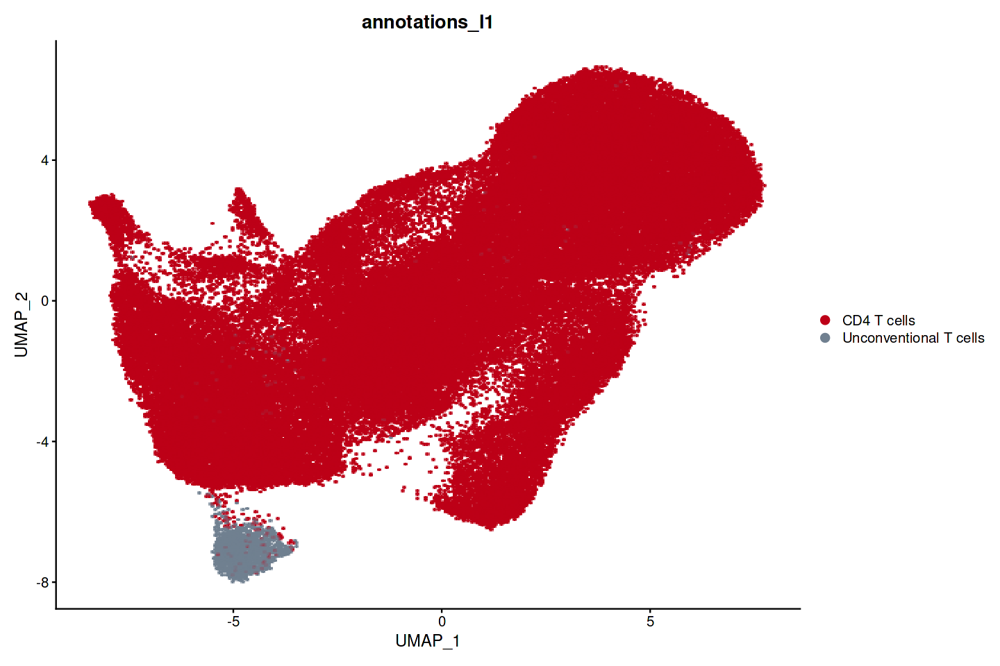

In [90]:
options(repr.plot.width = 12, repr.plot.height = 8)

DimPlot(new_dia_cd4, group.by = "annotations_l1", raster = T, pt.size = 2, 
       cols = c("#BD0017", "slategray"))

In [70]:
saveRDS(new_dia_cd4, "data/processed/cd4_full.rds")

ERROR: Error in saveRDS(new_dia_cd4, "data/processed/cd4_full.rds"): error writing to connection


# Analysis CD4 Level 2

In [170]:
new_dia_cd4  <- readRDS("data/processed/cd4_full.rds")

In [102]:
merged.list  <- SplitObject(subset(new_dia_cd4, annotations_l1 == "CD4 T cells"), split.by = "Experiment_ID")

In [103]:
# normalize and identify variable features for each dataset independently
merged.list <- lapply(X = merged.list, FUN = function(x) {
    DefaultAssay(x)  <- "RNA"
    x$barcode  <- colnames(x)
    x <- NormalizeData(x)
    x <- FindVariableFeatures(x, selection.method = "vst", nfeatures = 800)
})

In [104]:
new_dia_experiment <- Run.STACAS(merged.list, dims = 1:15)

Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 1.0 GiB”
Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 1.7 GiB”
Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 1.4 GiB”
Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 1.1 GiB”
Preparing PCA embeddings for objects...

Building integration tree with base dataset: 5

Merging dataset 3 into 5

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 4 into 5 3

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 6 into 5 3 4

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 2 into 1

Extracting anchors for merged samples

Finding 

In [85]:
new_dia_experiment <- RunUMAP(new_dia_experiment, dims = 1:15)

09:30:47 UMAP embedding parameters a = 0.9922 b = 1.112

09:30:47 Read 85131 rows and found 10 numeric columns

09:30:47 Using Annoy for neighbor search, n_neighbors = 30

09:30:47 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

09:31:01 Writing NN index file to temp file /tmp/RtmpF1LRFr/file308a932214dcc

09:31:01 Searching Annoy index using 24 threads, search_k = 3000

09:31:04 Annoy recall = 100%

09:31:06 Commencing smooth kNN distance calibration using 24 threads
 with target n_neighbors = 30

09:31:13 Initializing from normalized Laplacian + noise (using irlba)

09:31:19 Commencing optimization for 200 epochs, with 3486636 positive edges

09:32:18 Optimization finished



In [86]:
cd4_subcluster  <- new_dia_experiment

In [109]:
cd4_subcluster <- RunUMAP(cd4_subcluster, dims = 1:11)

12:33:15 UMAP embedding parameters a = 0.9922 b = 1.112

12:33:15 Read 85131 rows and found 11 numeric columns

12:33:15 Using Annoy for neighbor search, n_neighbors = 30

12:33:15 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

12:33:28 Writing NN index file to temp file /tmp/RtmpF1LRFr/file308a95c9ae584

12:33:28 Searching Annoy index using 1 thread, search_k = 3000

12:34:19 Annoy recall = 100%

12:34:21 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

12:34:29 Initializing from normalized Laplacian + noise (using irlba)

12:34:38 Commencing optimization for 200 epochs, with 3529254 positive edges

12:35:44 Optimization finished



In [110]:
cd4_subcluster <- FindNeighbors(cd4_subcluster, reduction = "pca", dims = 1:11)

Computing nearest neighbor graph

Computing SNN



In [116]:
cd4_subcluster <- FindClusters(cd4_subcluster, resolution = 0.9)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 85131
Number of edges: 2197807

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8184
Number of communities: 15
Elapsed time: 56 seconds


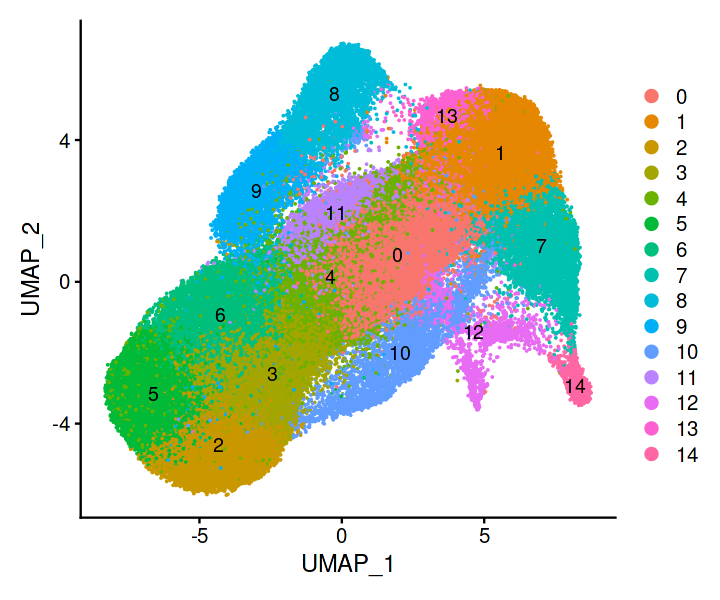

In [117]:
options(repr.plot.width = 6, repr.plot.height = 5)

DimPlot(cd4_subcluster, label = T)

In [108]:
for(i in c(13:15)){
    for(j in c(0.7,0.8)){
        cd4_subcluster <- RunUMAP(cd4_subcluster, dims = 1:i)
        cd4_subcluster <- FindNeighbors(cd4_subcluster, reduction = "pca", dims = 1:i)
        cd4_subcluster <- FindClusters(cd4_subcluster, resolution = j)
        print(DimPlot(cd4_subcluster, label = T) + ggtitle(paste("dimplot_",i,'res_',j,".png")))
        ggsave(filename = paste("dimplot_",i,'res_',j,".png"), width = 15.5, height = 12, units = "cm")
           }
    }


ERROR: Error in Embeddings(object[[reduction]])[, dims]: subscript out of bounds


In [78]:
plan("multisession")

In [79]:
mrk  <- FindAllMarkers(cd4_subcluster, logfc.threshold = log(1.5))

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11



In [80]:
write.csv(mrk, "markers_cd4_full.csv")

In [81]:
cd4_subcluster@meta.data  <- cd4_subcluster@meta.data  %>% 
mutate(annotations_l2 = recode_factor(seurat_clusters, "0" = "Naive",
                                     "1" = "Tfh",
                                     "2" = "Naive",
                                     "3" = "Naive",
                                     "4" = "Tfh",
                                     "5" = "Treg",
                                     "6" = "Teff",
                                     "7" = "Tfh",
                                     "8" = "ISAGhi",
                                     "9" = "Treg",
                                     "10" = "Proliferating",
                                     "11" = "Temra",
                                     "12" = "Teff",
                                     "13" = ))

ERROR: [1m[33mError[39m in `mutate()`:[22m
[1m[22m[36mℹ[39m In argument: `annotations_l2 = recode_factor(...)`.
[1mCaused by error in `list2()`:[22m
[1m[22m[33m![39m Argument 14 can't be empty.


In [ ]:
saveRDS(cd4_subcluster, "data/processed/cd4_subcluster.rds")

### Cluster tree

In [ ]:
DimPlot(cd4_subcluster, label = T)

In [ ]:
cd4_subcluster <- BuildClusterTree(
  cd4_subcluster,
  dims = 1:12,
  reorder = FALSE,
  reorder.numeric = FALSE
)

In [ ]:
tree <- cd4_subcluster@tools$BuildClusterTree
tree$tip.label <- paste0("Cluster ", tree$tip.label)

In [ ]:
p <- ggtree::ggtree(tree, aes(x, y)) +
  scale_y_reverse() +
  ggtree::geom_tree() +
  ggtree::theme_tree() +
  ggtree::geom_tiplab(offset = 1) +
  ggtree::geom_tippoint(color = (scales::hue_pal() (14)), shape = 16, size = 5) +
  coord_cartesian(clip = 'off') +
  theme(plot.margin = unit(c(0,2.5,0,0), 'cm'))

#ggsave('plots/cluster_tree.png', p, height = 4, width = 6)

In [ ]:
options(repr.plot.width=3.5, repr.plot.height=3)
p

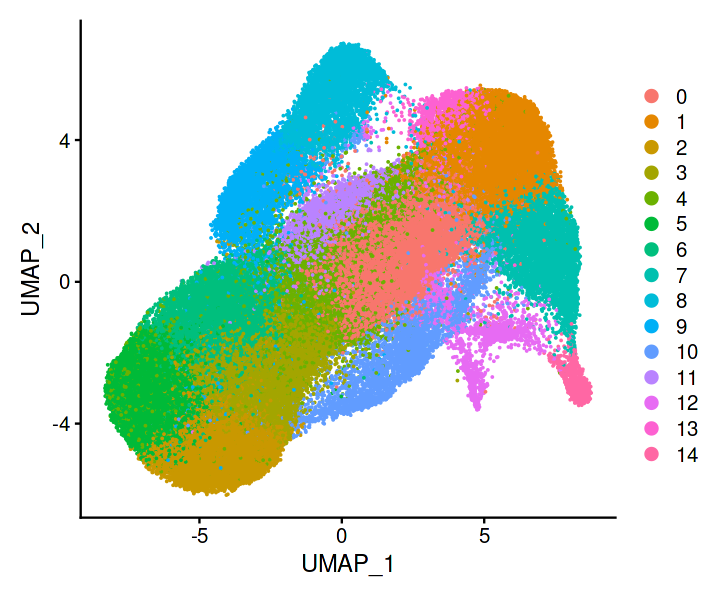

In [138]:
DimPlot(cd4_subcluster)

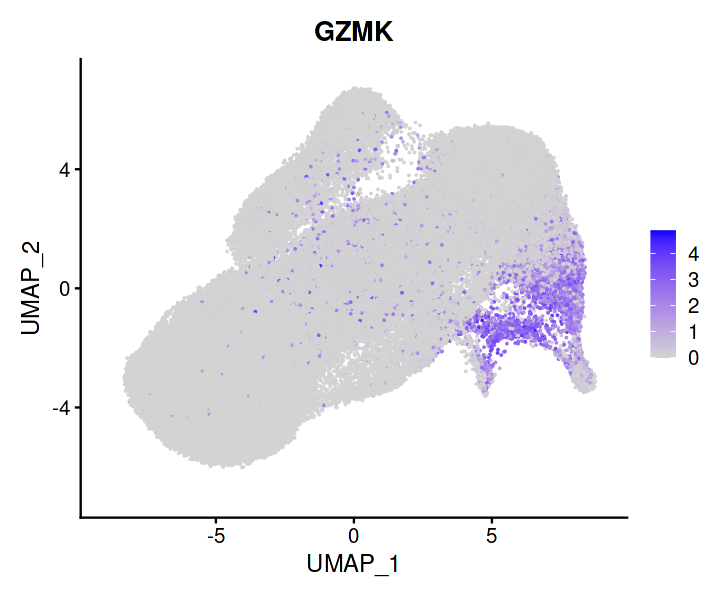

In [139]:
FeaturePlot(cd4_subcluster, features = "GZMK", min.cutoff = 0)

## Analysis Level 3: Treg

In [140]:
treg <- subset(cd4_subcluster, seurat_clusters %in% c(8,9,11))

In [141]:
treg_dia_experiment  <- SplitObject(treg, split.by = "Experiment_ID")

In [142]:
plan("sequential")

In [143]:
# normalize and identify variable features for each dataset independently
merged.list <- lapply(X = treg_dia_experiment, FUN = function(x) {
    DefaultAssay(x)  <- "RNA"
    x$barcode  <- colnames(x)
    x <- NormalizeData(x)
    x <- FindVariableFeatures(x, selection.method = "vst", nfeatures = 750)
})

In [144]:
treg_dia_experiment <- Run.STACAS(treg_dia_experiment, dims = 1:12)
treg_dia_experiment <- RunUMAP(treg_dia_experiment, dims = 1:12) 

Warning message in FindVariableFeatures.Assay(object = assay.data, selection.method = selection.method, :
“selection.method set to 'vst' but count slot is empty; will use data slot instead”
Warning message in eval(predvars, data, env):
“NaNs produced”
Warning message in hvf.info$variance.expected[not.const] <- 10^fit$fitted:
“number of items to replace is not a multiple of replacement length”
Warning message in FindVariableFeatures.Assay(object = assay.data, selection.method = selection.method, :
“selection.method set to 'vst' but count slot is empty; will use data slot instead”
Warning message in eval(predvars, data, env):
“NaNs produced”
Warning message in hvf.info$variance.expected[not.const] <- 10^fit$fitted:
“number of items to replace is not a multiple of replacement length”
Warning message in FindVariableFeatures.Assay(object = assay.data, selection.method = selection.method, :
“selection.method set to 'vst' but count slot is empty; will use data slot instead”
Warning message in

In [145]:
treg_dia_experiment  <- FindNeighbors(treg_dia_experiment)
treg_dia_experiment  <- FindClusters(treg_dia_experiment, resolution = 0.6)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 12332
Number of edges: 370235

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8060
Number of communities: 7
Elapsed time: 2 seconds


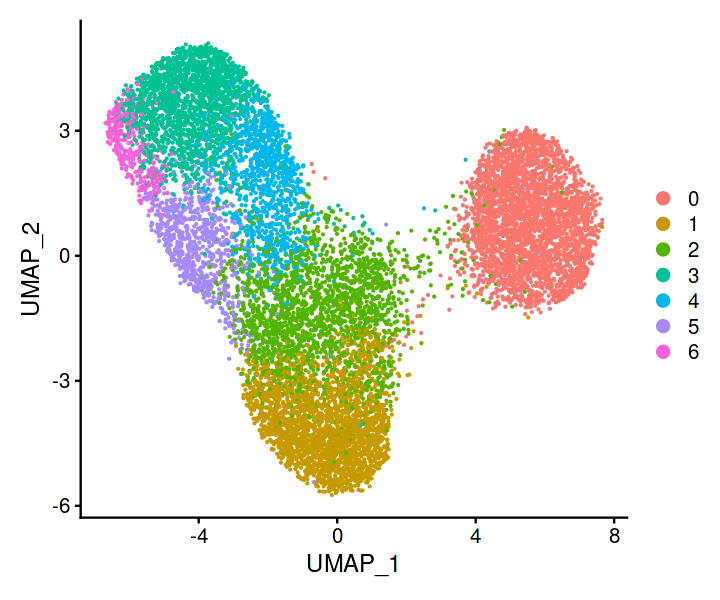

In [146]:
# Visualize
DimPlot(treg_dia_experiment)

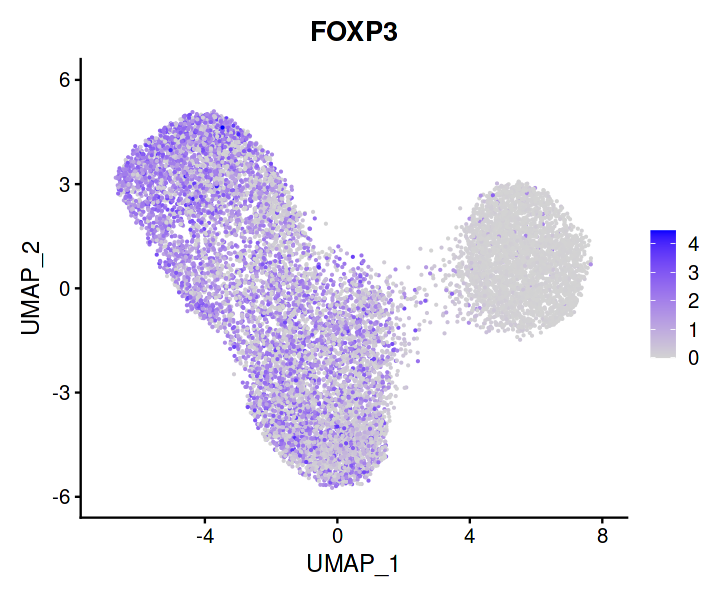

In [147]:
FeaturePlot(treg_dia_experiment, features = "FOXP3", min.cutoff = 0)

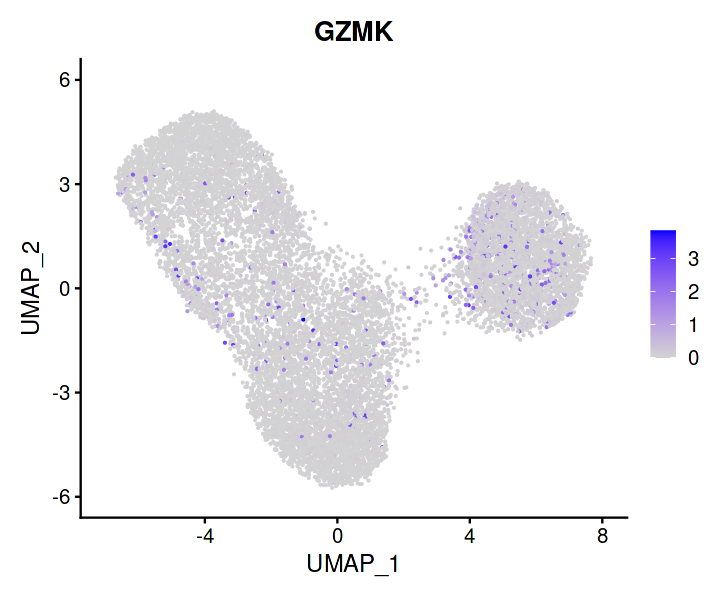

In [148]:
FeaturePlot(treg_dia_experiment, features = "GZMK", min.cutoff = 0)

## Analysis Level 3: Teffector

In [121]:
teff <- subset(cd4_subcluster, seurat_clusters %in% c(2,7,11,12,13))

In [122]:
teff

An object of class Seurat 
16422 features across 19305 samples within 4 assays 
Active assay: integrated (995 features, 995 variable features)
 3 other assays present: RNA, Antibodies, PTPRC
 2 dimensional reductions calculated: pca, umap

In [123]:
teff_dia_experiment  <- SplitObject(teff, split.by = "Experiment_ID")

In [124]:
teff_dia_experiment

$Exp10
An object of class Seurat 
16422 features across 545 samples within 4 assays 
Active assay: integrated (995 features, 995 variable features)
 3 other assays present: RNA, Antibodies, PTPRC
 2 dimensional reductions calculated: pca, umap

$Exp11
An object of class Seurat 
16422 features across 566 samples within 4 assays 
Active assay: integrated (995 features, 995 variable features)
 3 other assays present: RNA, Antibodies, PTPRC
 2 dimensional reductions calculated: pca, umap

$Exp16
An object of class Seurat 
16422 features across 3119 samples within 4 assays 
Active assay: integrated (995 features, 995 variable features)
 3 other assays present: RNA, Antibodies, PTPRC
 2 dimensional reductions calculated: pca, umap

$Exp18
An object of class Seurat 
16422 features across 4957 samples within 4 assays 
Active assay: integrated (995 features, 995 variable features)
 3 other assays present: RNA, Antibodies, PTPRC
 2 dimensional reductions calculated: pca, umap

$Exp19
An object o

In [125]:
plan("sequential")

In [126]:
# normalize and identify variable features for each dataset independently
merged.list <- lapply(X = teff_dia_experiment, FUN = function(x) {
    DefaultAssay(x)  <- "RNA"
    x$barcode  <- colnames(x)
    x <- NormalizeData(x)
    x <- FindVariableFeatures(x, selection.method = "vst", nfeatures = 500)
})

library(STACAS)

teff_dia_experiment <- Run.STACAS(merged.list, dims = 1:10)
teff_dia_experiment <- RunUMAP(teff_dia_experiment, dims = 1:10) 

Preparing PCA embeddings for objects...

Building integration tree with base dataset: 5

Merging dataset 3 into 5

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 6 into 5 3

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 4 into 5 3 6

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 1 into 5 3 6 4

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 2 into 5 3 6 4 1

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Centering and scaling data matrix

PC_ 1 
Positive:  JUNB, CXCR4, PTGER2, CISH, MAL, DUSP1, FOS, AHNAK, SOCS3, HOPX 
	   CTSW, KLF6, NFKBIA, MYBL1, BHL

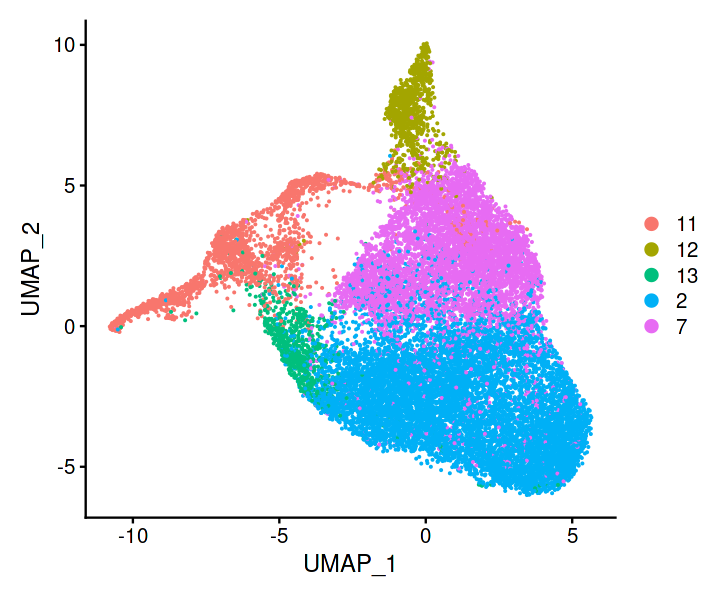

In [127]:
# Visualize

DimPlot(teff_dia_experiment)

In [128]:
teff_dia_experiment  <- FindNeighbors(teff_dia_experiment)
teff_dia_experiment  <- FindClusters(teff_dia_experiment, resolution = 0.5)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 19305
Number of edges: 576187

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8474
Number of communities: 10
Elapsed time: 6 seconds


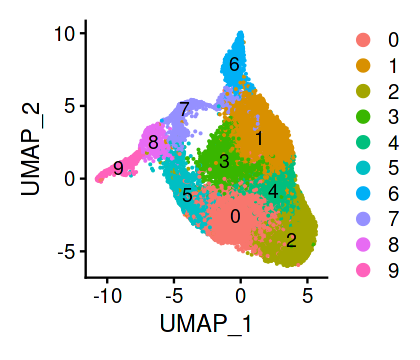

In [146]:
DimPlot(teff_dia_experiment, label = T)